#Tonos de Shepard
Acústica, psicoacústica, y procesamiento de señales.
Los Tonos de Shepard son una serie de tonos puros que, cuando se reproducen en secuencia, crean la ilusión auditiva de un tono que sube o baja infinitamente en altura, a pesar de que en realidad no ocurre un cambio real en la frecuencia.
Los Tonos de Shepard consisten en varios tonos sinusoidales espaciados por octavas. Al variar la amplitud de estos tonos de forma que los extremos (frecuencias más bajas y más altas) se atenúan, se crea una ilusión de un tono que parece subir o bajar infinitamente.
Psicoacústica: La percepción de los Tonos de Shepard explota una característica de nuestro sistema auditivo: la capacidad de identificar tonos en diferentes rangos de frecuencia, pero sin una clara distinción cuando los tonos están compuestos de múltiples frecuencias.

Reproduciendo escala ascendente:


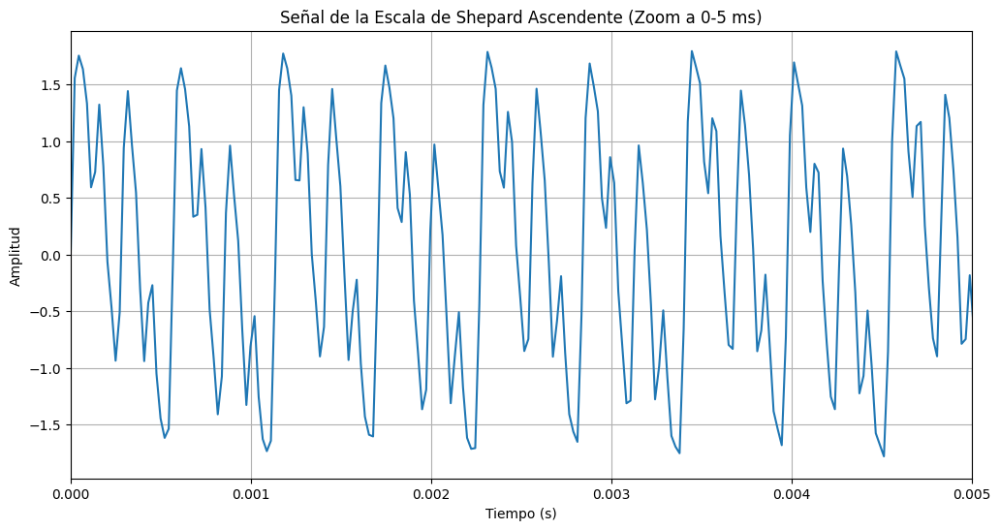

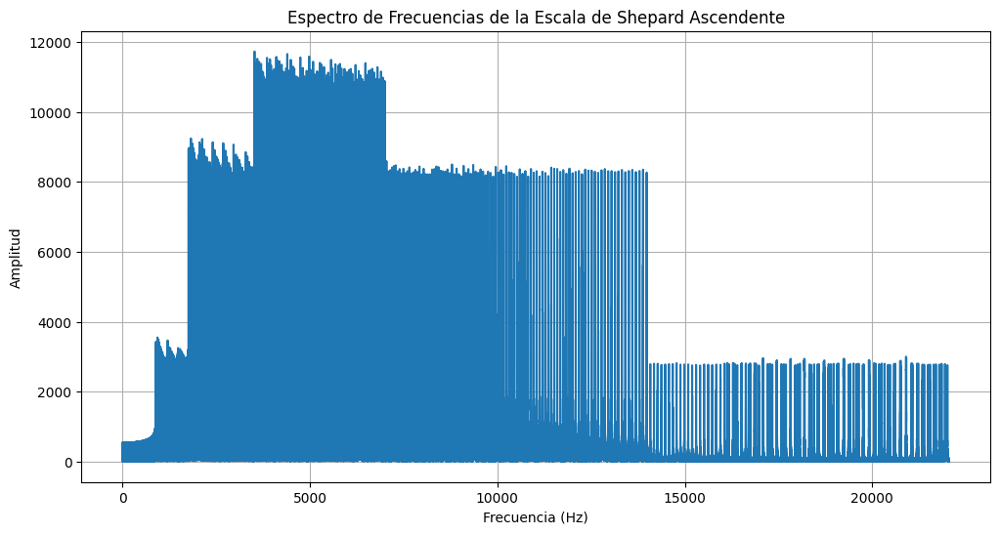

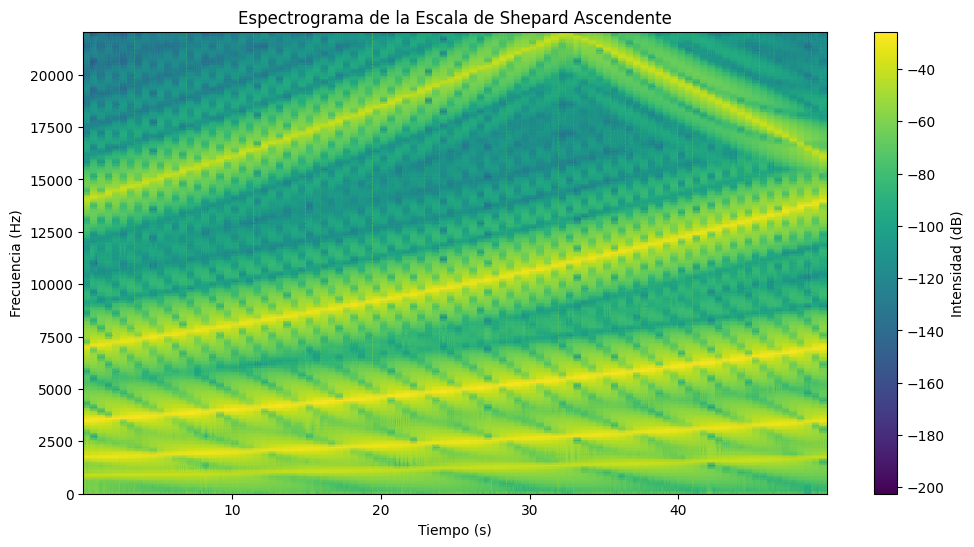

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio
from scipy.signal import spectrogram # Import spectrogram

def generate_shepard_tone(base_freq, num_tones, duration, sample_rate):
    t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)
    tone = np.zeros_like(t)

    for i in range(num_tones):
        freq = base_freq * (2 ** i)
        amplitude = np.sin(np.pi * i / num_tones) ** 2
        tone += amplitude * np.sin(2 * np.pi * freq * t)

    return tone

# Parámetros
base_freq = 440  # Frecuencia base en Hz (Nota La)
num_tones = 6    # Número de tonos superpuestos
duration = 0.5   # Duración de cada tono en segundos
sample_rate = 44100  # Tasa de muestreo

# Generar el tono de Shepard
shepard_tone = generate_shepard_tone(base_freq, num_tones, duration, sample_rate)

# Reproducir el tono generado
Audio(shepard_tone, rate=sample_rate)

def generate_shepard_scale(base_freq, num_tones, duration, sample_rate, steps):
    scale = []
    for step in range(steps):
        tone = generate_shepard_tone(base_freq * (2 ** (step / steps)), num_tones, duration, sample_rate)
        scale.append(tone)
    return np.concatenate(scale)

# Parámetros adicionales
steps = 100  # Número de pasos en la escala (equivalente a una octava)

# Generar la escala de Shepard
shepard_scale = generate_shepard_scale(base_freq, num_tones, duration, sample_rate, steps)

# Reproducir la escala
print("Reproduciendo escala ascendente:")
display(Audio(shepard_scale, rate=sample_rate))

# Graficar señal, espectro de frecuencias y espectograma
# Graficar la señal
plt.figure(figsize=(12, 6))
plt.plot(np.linspace(0, len(shepard_scale)/sample_rate, len(shepard_scale)), shepard_scale)
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.title("Señal de la Escala de Shepard Ascendente (Zoom a 0-5 ms)")
plt.xlim(0, 0.005) # Set x-axis limit to 5 ms
plt.grid(True)
plt.show()

# Graficar el espectro de frecuencias (utilizando una porción de la señal para mayor claridad)
fft_result = np.fft.fft(shepard_scale)
frequencies = np.fft.fftfreq(len(shepard_scale), 1/sample_rate)

plt.figure(figsize=(12, 6))
plt.plot(frequencies[:len(frequencies)//2], np.abs(fft_result)[:len(frequencies)//2])
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Amplitud")
plt.title("Espectro de Frecuencias de la Escala de Shepard Ascendente")
plt.grid(True)
plt.show()

# Graficar el espectrograma
f, t, Sxx = spectrogram(shepard_scale, sample_rate)

plt.figure(figsize=(12, 6))
plt.pcolormesh(t, f, 10 * np.log10(Sxx), shading='gouraud')
plt.ylabel('Frecuencia (Hz)')
plt.xlabel('Tiempo (s)')
plt.title("Espectrograma de la Escala de Shepard Ascendente")
plt.colorbar(label='Intensidad (dB)')
plt.show()

El espectrograma es una representación visual de cómo cambia el espectro de frecuencias de una señal de audio a lo largo del tiempo.

En el contexto de los Tonos de Shepard con 12 tonos (si modificamos num_tones a 12), el espectrograma mostraría bandas horizontales correspondientes a cada uno de esos 12 tonos puros superpuestos. A medida que la escala asciende o desciende, estas bandas se desplazarían verticalmente, pero debido a la ilusión de Shepard, las bandas en los extremos (frecuencias muy bajas y muy altas) se desvanecerían mientras que nuevas bandas aparecerían en el rango medio, creando la sensación de movimiento infinito a pesar de que las frecuencias absolutas no cambian de forma lineal a través de las octavas.

Cada banda horizontal en el espectrograma representa la energía de un tono específico a una frecuencia determinada a lo largo del tiempo. La intensidad del color en el espectrograma indica la amplitud o "volumen" de ese tono en un momento dado.

#Ejercicio 14
- Modificar parámetros como num_tones, base_freq, y steps para observar cómo cambia la percepción.
- ¿Qué ocurre si cambia la tasa de muestreo o la duración de cada tono?
- Implementar una versión que genera una escala descendente.
- Graficar señal, espectro de frecuencias y espectograma.

Reproduciendo escala descendente:


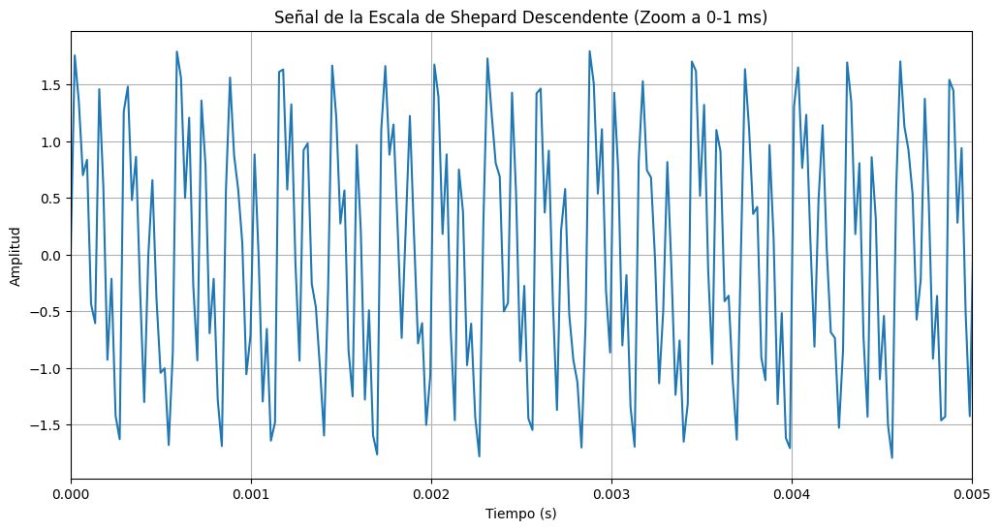

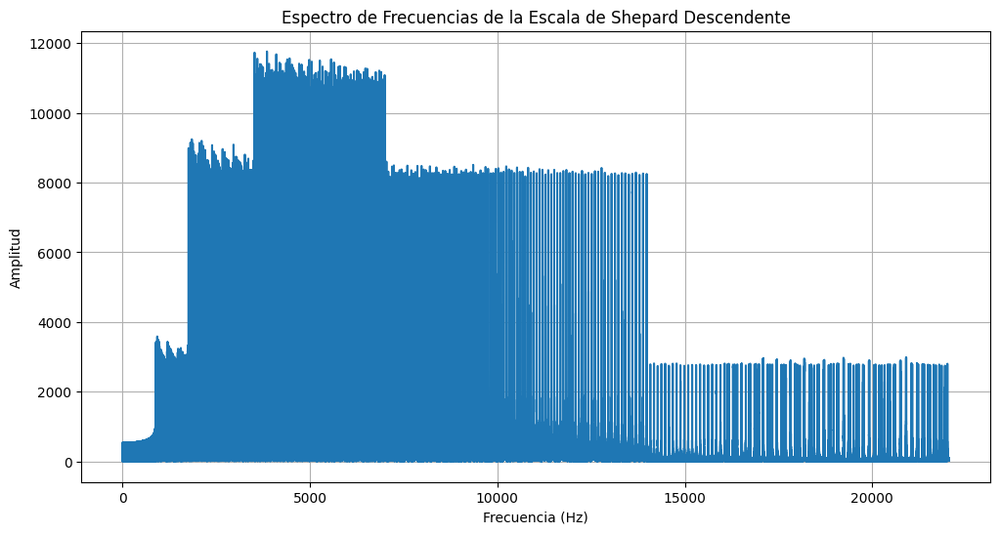

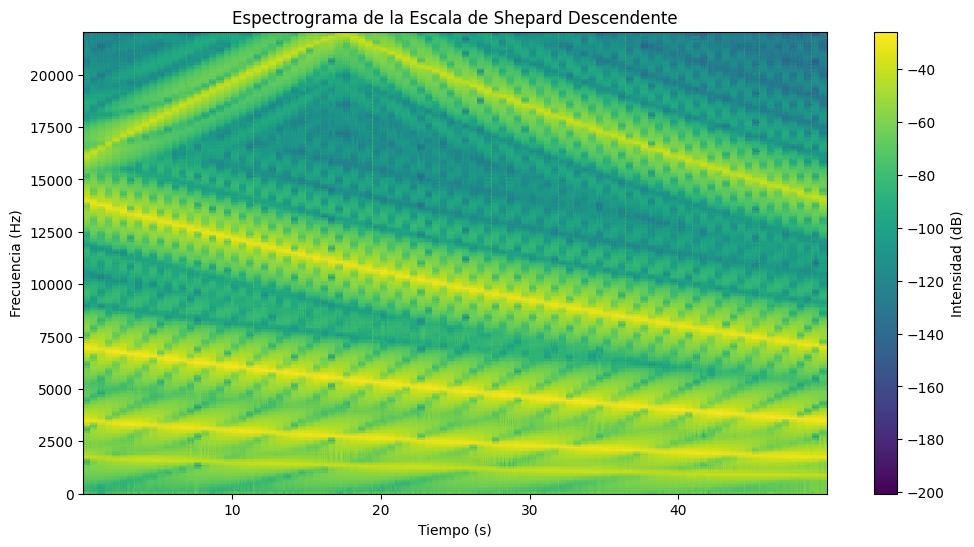

In [ ]:
# Implementar una versión que genera una escala descendente
def generate_shepard_scale_descending(base_freq, num_tones, duration, sample_rate, steps):
    scale = []
    for step in range(steps):
        # Calcular la frecuencia para la escala descendente
        freq_multiplier = 2 ** ((steps - 1 - step) / steps)
        tone = generate_shepard_tone(base_freq * freq_multiplier, num_tones, duration, sample_rate)
        scale.append(tone)
    return np.concatenate(scale)

# Generar la escala de Shepard descendente
shepard_scale_descending = generate_shepard_scale_descending(base_freq, num_tones, duration, sample_rate, steps)

# Reproducir la escala descendente
print("Reproduciendo escala descendente:")
display(Audio(shepard_scale_descending, rate=sample_rate))

# Graficar señal, espectro de frecuencias y espectograma
import matplotlib.pyplot as plt
from scipy.signal import spectrogram

# Graficar la señal
plt.figure(figsize=(12, 6))
plt.plot(np.linspace(0, len(shepard_scale_descending)/sample_rate, len(shepard_scale_descending)), shepard_scale_descending)
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud")
plt.title("Señal de la Escala de Shepard Descendente (Zoom a 0-1 ms)")
plt.xlim(0, 0.005) # Set x-axis limit to 1 ms
plt.grid(True)
plt.show()

# Graficar el espectro de frecuencias (utilizando una porción de la señal para mayor claridad)
fft_result = np.fft.fft(shepard_scale_descending)
frequencies = np.fft.fftfreq(len(shepard_scale_descending), 1/sample_rate)

plt.figure(figsize=(12, 6))
plt.plot(frequencies[:len(frequencies)//2], np.abs(fft_result)[:len(frequencies)//2])
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Amplitud")
plt.title("Espectro de Frecuencias de la Escala de Shepard Descendente")
plt.grid(True)
plt.show()

# Graficar el espectrograma
f, t, Sxx = spectrogram(shepard_scale_descending, sample_rate)

plt.figure(figsize=(12, 6))
plt.pcolormesh(t, f, 10 * np.log10(Sxx), shading='gouraud')
plt.ylabel('Frecuencia (Hz)')
plt.xlabel('Tiempo (s)')
plt.title("Espectrograma de la Escala de Shepard Descendente")
plt.colorbar(label='Intensidad (dB)')
plt.show()